In [ ]:
!pip install tensorflow-gpu==1.13.1
!pip install tensorflow==1.13.1
!pip install keras==2.1.0
!pip install h5py==2.10.0
!pip install imutils

     |████████████████████████████████| 345.0 MB 3.8 kB/s 
     |████████████████████████████████| 3.2 MB 33.3 MB/s 
     |████████████████████████████████| 50 kB 5.8 MB/s 
     |████████████████████████████████| 367 kB 38.3 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.7.0
    Uninstalling tensorflow-estimator-2.7.0:
      Successfully uninstalled tensorflow-estimator-2.7.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.7.0
    Uninstalling tensorboard-2.7.0:
      Successfully uninstalled tensorboard-2.7.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.7.0 requires tensorboard~=2.6, but you have tensorboard 1.13.1 which is incompatible.
tensorflow 2.7.0 requires tensorflow-estimator<2.8,~=2.7.0rc0, but you have tensorflow-estimator 1.13.0 which is in

In [ ]:
# Git clone Mask RCNN

!git clone https://github.com/matterport/Mask_RCNN


Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 125.23 MiB | 13.82 MiB/s, done.
Resolving deltas: 100% (565/565), done.


In [ ]:
# Install the requirements

%cd Mask_RCNN
!pip install -r requirements.txt
!python setup.py install
!wget https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5
!tf_upgrade_v2 --intree mrcnn --inplace --reportfile report.txt

/content/Mask_RCNN
     |████████████████████████████████| 397 kB 4.3 MB/s 
     |████████████████████████████████| 154 kB 55.8 MB/s 
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'description-file' will not be supported in future versions. Please use the underscore name 'description_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'license-file' will not be supported in future versions. Please use the underscore name 'license_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'requirements-file' will not be supported in future versions. Please use the underscore name 'requirements_file' instead
  % (opt, underscore_opt))
running install
running bdist_egg
running egg_info
creating mask_rcnn.egg-info
writing mask_rcnn.egg-info/PKG-INFO
writing dependency_

In [ ]:
import os
import sys
import json
import datetime
import numpy as np
import skimage.io
from imgaug import augmenters as iaa
import matplotlib.pyplot as plt
import pycocotools._mask as _mask

# Import Mask RCNN

from mrcnn.config import Config
from mrcnn import utils
from mrcnn import model as modellib
from mrcnn import visualize

In [ ]:
# Root directory of the project

ROOT_DIR = os.path.abspath("")

# To find local version of the library

sys.path.append(ROOT_DIR)

/content/Mask_RCNN


/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/dtypes.py:529: FutureWarning: Passing (type, 1) or 

In [ ]:
# Directory to save logs and model checkpoints, if not provided
# through the command line argument --logs

DEFAULT_LOGS_DIR = os.path.join(ROOT_DIR, "logs")

# Results directory
# Save submission files here

RESULTS_DIR = os.path.join(ROOT_DIR, "results/nucleus/")

/content/Mask_RCNN/mask_rcnn_coco.h5


In [ ]:
from google.colab import drive
from google_drive_downloader import GoogleDriveDownloader as gdd

In [ ]:


gdd.download_file_from_google_drive(file_id='1heKw6ldjI1DfGC8HfBAd8KBwUXTEH0BA',
                                    dest_path='/content/Mask_RCNN/train.zip',
                                    unzip=True)
data_listdir = os.listdir("/content/Mask_RCNN/train")
print(data_listdir)

Unzipping...Done.
['TCGA-DK-A2I6-01A-01-TS1', 'TCGA-HE-7128-01Z-00-DX1', 'TCGA-CH-5767-01Z-00-DX1', 'TCGA-38-6178-01Z-00-DX1', 'TCGA-21-5786-01Z-00-DX1', 'TCGA-HE-7130-01Z-00-DX1', 'TCGA-AR-A1AS-01Z-00-DX1', 'TCGA-A7-A13F-01Z-00-DX1', 'TCGA-G9-6363-01Z-00-DX1', 'TCGA-B0-5711-01Z-00-DX1', 'TCGA-AR-A1AK-01Z-00-DX1', 'TCGA-G9-6362-01Z-00-DX1', 'TCGA-18-5592-01Z-00-DX1', 'TCGA-49-4488-01Z-00-DX1', 'TCGA-B0-5710-01Z-00-DX1', 'TCGA-B0-5698-01Z-00-DX1', 'TCGA-E2-A1B5-01Z-00-DX1', 'TCGA-RD-A8N9-01A-01-TS1', 'TCGA-21-5784-01Z-00-DX1', 'TCGA-E2-A14V-01Z-00-DX1', 'TCGA-HE-7129-01Z-00-DX1', 'TCGA-KB-A93J-01A-01-TS1', 'TCGA-G9-6356-01Z-00-DX1', 'TCGA-NH-A8F7-01A-01-TS1']


In [ ]:
# Download test image

gdd.download_file_from_google_drive(file_id='17DE6SvDUXSi0qTZ7Pe1iIWfvlpA5JyOS',
                                    dest_path='/content/Mask_RCNN/test.zip',
                                    unzip=True)
data_listdir = os.listdir("/content/Mask_RCNN/test")
print(data_listdir)

Unzipping...Done.
['TCGA-G9-6348-01Z-00-DX1.png', 'TCGA-G2-A2EK-01A-02-TSB.png', 'TCGA-AY-A8YK-01A-01-TS1.png', 'TCGA-G9-6336-01Z-00-DX1.png', 'TCGA-50-5931-01Z-00-DX1.png', 'TCGA-A7-A13E-01Z-00-DX1.png']


In [ ]:
# Download the model weights

gdd.download_file_from_google_drive(file_id='1xqyJUcDy9HLffHRD3gFUiFhuLFGRX05a',
                                    dest_path='/content/Mask_RCNN/weight.zip',
                                    unzip=True)

Unzipping...Done.


In [ ]:
VAL_IMAGE_IDS = [
    'TCGA-AR-A1AS-01Z-00-DX1',
    'TCGA-G9-6356-01Z-00-DX1',
    'TCGA-HE-7130-01Z-00-DX1',
    'TCGA-21-5784-01Z-00-DX1'
]

In [ ]:
class NucleusConfig(Config):
    """Configuration for training on the nucleus segmentation dataset."""
    # Give the configuration a recognizable name
    NAME = "nucleus"

    # Adjust depending on your GPU memory
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # Background + nucleus

    # Number of training and validation steps per epoch
    # STEPS_PER_EPOCH = 100
    STEPS_PER_EPOCH = (24 - len(VAL_IMAGE_IDS)) // IMAGES_PER_GPU
    VALIDATION_STEPS = max(1, len(VAL_IMAGE_IDS) // IMAGES_PER_GPU)

    # Don't exclude based on confidence. Since we have two classes
    # then 0.5 is the minimum anyway as it picks between nucleus and BG
    DETECTION_MIN_CONFIDENCE = 0.5

    # Backbone network architecture
    # Supported values are: resnet50, resnet101
    BACKBONE = "resnet50"

    # Input image resizing
    # Random crops of size 512x512
    IMAGE_RESIZE_MODE = "crop"
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    IMAGE_MIN_SCALE = 2.0

    # Length of square anchor side in pixels
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)

    # ROIs kept after non-maximum supression (training and inference)
    POST_NMS_ROIS_TRAINING = 1000
    POST_NMS_ROIS_INFERENCE = 2000

    # Non-max suppression threshold to filter RPN proposals.
    # You can increase this during training to generate more propsals.
    RPN_NMS_THRESHOLD = 0.9

    # How many anchors per image to use for RPN training
    RPN_TRAIN_ANCHORS_PER_IMAGE = 64

    # Image mean (RGB)
    MEAN_PIXEL = np.array([43.53, 39.56, 48.22])

    # If enabled, resizes instance masks to a smaller size to reduce
    # memory load. Recommended when using high-resolution images.
    USE_MINI_MASK = True
    MINI_MASK_SHAPE = (56, 56)  # (height, width) of the mini-mask

    # Number of ROIs per image to feed to classifier/mask heads
    # The Mask RCNN paper uses 512 but often the RPN doesn't generate
    # enough positive proposals to fill this and keep a positive:negative
    # ratio of 1:3. You can increase the number of proposals by adjusting
    # the RPN NMS threshold.
    TRAIN_ROIS_PER_IMAGE = 128

    # Maximum number of ground truth instances to use in one image
    MAX_GT_INSTANCES = 400

    # Max number of final detections per image
    DETECTION_MAX_INSTANCES = 800

config = NucleusConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        800
DETECTION_MIN_CONFIDENCE       0.5
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                2.0
IMAGE_RESIZE_MODE              crop
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE              

In [ ]:
class NucleusInferenceConfig(NucleusConfig):
    # Set batch size to 1 to run one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    # Don't resize imager for inferencing
    IMAGE_RESIZE_MODE = "pad64"
    # Non-max suppression threshold to filter RPN proposals.
    # You can increase this during training to generate more propsals.
    RPN_NMS_THRESHOLD = 0.8

# **Define our own dataset**

In [ ]:
class NucleusDataset(utils.Dataset):

    def load_nucleus(self, dataset_dir, subset):
        """Load a subset of the nuclei dataset.
        dataset_dir: Root directory of the dataset
        subset: Subset to load. Either the name of the sub-directory,
                such as stage1_train, stage1_test, ...etc. or, one of:
                * train: stage1_train excluding validation images
                * val: validation images from VAL_IMAGE_IDS
        """
        # Add classes. We have one class.
        # Naming the dataset nucleus, and the class nucleus
        self.add_class("nucleus", 1, "nucleus")
        
        # Which subset?
        # "val": use hard-coded list above
        # "train": use data from stage1_train minus the hard-coded list above
        # else: use the data from the specified sub-directory
        
        # assert subset in ["train", "val", "stage1_train", "stage1_test", "stage2_test"]
        # subset_dir = "stage1_train" if subset in ["train", "val"] else subset
        # dataset_dir = os.path.join(dataset_dir, subset)
        if subset == "val":
            image_ids = VAL_IMAGE_IDS
        else:
            # Get image ids from directory names
            print(dataset_dir)
            if subset=="train":
                image_ids = next(os.walk(dataset_dir))[1]
                image_ids = list(set(image_ids) - set(VAL_IMAGE_IDS))
            else:
                image_ids = os.listdir(dataset_dir)
                print("Image: ",image_ids)
                
                
        
        # image_ids = next(os.walk(dataset_dir))[1]
        # Add images
        for image_id in image_ids:
            if subset=="train":
                self.add_image(
                    "nucleus",
                    image_id=image_id,
                    path=os.path.join(dataset_dir, image_id, "images/{}.png".format(image_id)))
            else:
                self.add_image(
                    "nucleus",
                    image_id=image_id[0:-4],
                    path=os.path.join(dataset_dir, image_id))

    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        info = self.image_info[image_id]
        # Get mask directory from image path
        mask_dir = os.path.join(os.path.dirname(os.path.dirname(info['path'])), "masks")

        # Read mask files from .png image
        mask = []
        for f in next(os.walk(mask_dir))[2]:
            if f.endswith(".png"):
                m = skimage.io.imread(os.path.join(mask_dir, f)).astype(np.bool)
                mask.append(m)
        mask = np.stack(mask, axis=-1)
        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID, we return an array of ones
        return mask, np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "nucleus":
            return info["id"]
        else:
            super(self.__class__, self).image_reference(image_id)

In [ ]:
def train(model, dataset_dir, subset):
    """Train the model."""
    # Training dataset.
    print("Function: train")
    dataset_train = NucleusDataset()
    print("Dataset")
    dataset_train.load_nucleus(dataset_dir, subset)
    print("Load_nucleus: ", dataset_dir)
    dataset_train.prepare()

    # Validation dataset
    dataset_val = NucleusDataset()
    dataset_val.load_nucleus(dataset_dir, "val")
    dataset_val.prepare()

    # Image augmentation
    # http://imgaug.readthedocs.io/en/latest/source/augmenters.html
    augmentation = iaa.SomeOf((0, 2), [
        iaa.Fliplr(0.5),
        iaa.Flipud(0.5),
        iaa.OneOf([iaa.Affine(rotate=90),
                   iaa.Affine(rotate=180),
                   iaa.Affine(rotate=270)]),
        iaa.Multiply((0.8, 1.5)),
        iaa.GaussianBlur(sigma=(0.0, 5.0))
    ])

    # *** This training schedule is an example. Update to your needs ***

    # If starting from imagenet, train heads only for a bit
    # since they have random weights
    print("Train network heads")
    model.train(dataset_train, dataset_val,
                learning_rate=config.LEARNING_RATE,
                epochs=10,
                augmentation=augmentation,
                layers='heads')

    print("Train all layers")
    model.train(dataset_train, dataset_val,
                learning_rate=config.LEARNING_RATE,
                epochs=20,
                augmentation=augmentation,
                layers='all')

In [ ]:
def encode(bimask):
    if len(bimask.shape) == 3:
        return _mask.encode(bimask)
    elif len(bimask.shape) == 2:
        h, w = bimask.shape
        return _mask.encode(bimask.reshape((h, w, 1), order='F'))[0]

In [ ]:

############################################################
#  Detection
############################################################

image_ids = {}
image_ids["TCGA-A7-A13E-01Z-00-DX1"] = 1
image_ids["TCGA-50-5931-01Z-00-DX1"] = 2
image_ids["TCGA-G2-A2EK-01A-02-TSB"] = 3
image_ids["TCGA-AY-A8YK-01A-01-TS1"] = 4
image_ids["TCGA-G9-6336-01Z-00-DX1"] = 5
image_ids["TCGA-G9-6348-01Z-00-DX1"] = 6

def detect(model, dataset_dir, subset):
    """Run detection on images in the given directory."""
    print("Running on {}".format(dataset_dir))

    # Create directory
    if not os.path.exists(RESULTS_DIR):
        os.makedirs(RESULTS_DIR)
    submit_dir = "submit_{:%Y%m%dT%H%M%S}".format(datetime.datetime.now())
    submit_dir = os.path.join(RESULTS_DIR, submit_dir)
    os.makedirs(submit_dir)

    # Read dataset
    dataset = NucleusDataset()
    dataset.load_nucleus(dataset_dir, subset)
    dataset.prepare()
    # Load over images
    submission = []
    for image_id in dataset.image_ids:
        # Load image and run detection
        image = dataset.load_image(image_id)
        # Detect objects
        r = model.detect([image], verbose=0)[0]
        print("All masks shape: ", r["masks"].shape)
        # Encode image to RLE. Returns a string of multiple lines
        source_id = dataset.image_info[image_id]["id"]
        for instance in range(len(r['class_ids'])):
            det_box_info = {}
            bimask = np.asfortranarray(r["masks"][:, :, instance])
            # An integer to identify the image
            det_box_info["image_id"] = image_ids[source_id]
        
            # A list ( [left_x, top_y, width, height] )
            det_box_info["bbox"] = r["rois"][instance].tolist()
        
            # A float number between 0 ~ 1 which means the confidence of the bbox
            print("Score: ", r["scores"][instance].item())
            det_box_info["score"] = r["scores"][instance].item()
        
            # An integer which means the label class
            det_box_info["category_id"] = 1
            seg_info = encode(bimask)
            seg_info["counts"] = seg_info["counts"].decode('ascii')
            det_box_info["segmentation"] = seg_info
            print(det_box_info)
            submission.append(det_box_info)
        
        # rle = mask_to_rle(source_id, r["masks"], r["scores"])
        # submission.append(rle)

        # Visualize the prediction results
        visualize.display_instances(
            image, r['rois'], r['masks'], r['class_ids'],
            dataset.class_names, r['scores'],
            show_bbox=False, show_mask=False,
            title="Predictions")
        # plt.savefig("{}/{}.png".format(submit_dir, dataset.image_info[image_id]["id"]))
    

    # Write the list to answer.json 
    json_object = json.dumps(submission, indent=4)
    file_path = os.path.join(submit_dir, "answer.json")
    with open(file_path, "w") as outfile:
        outfile.write(json_object)
    print("Saved to ", submit_dir)
    


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        800
DETECTION_MIN_CONFIDENCE       0.5
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                2.0
IMAGE_RESIZE_MODE              pad64
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE             

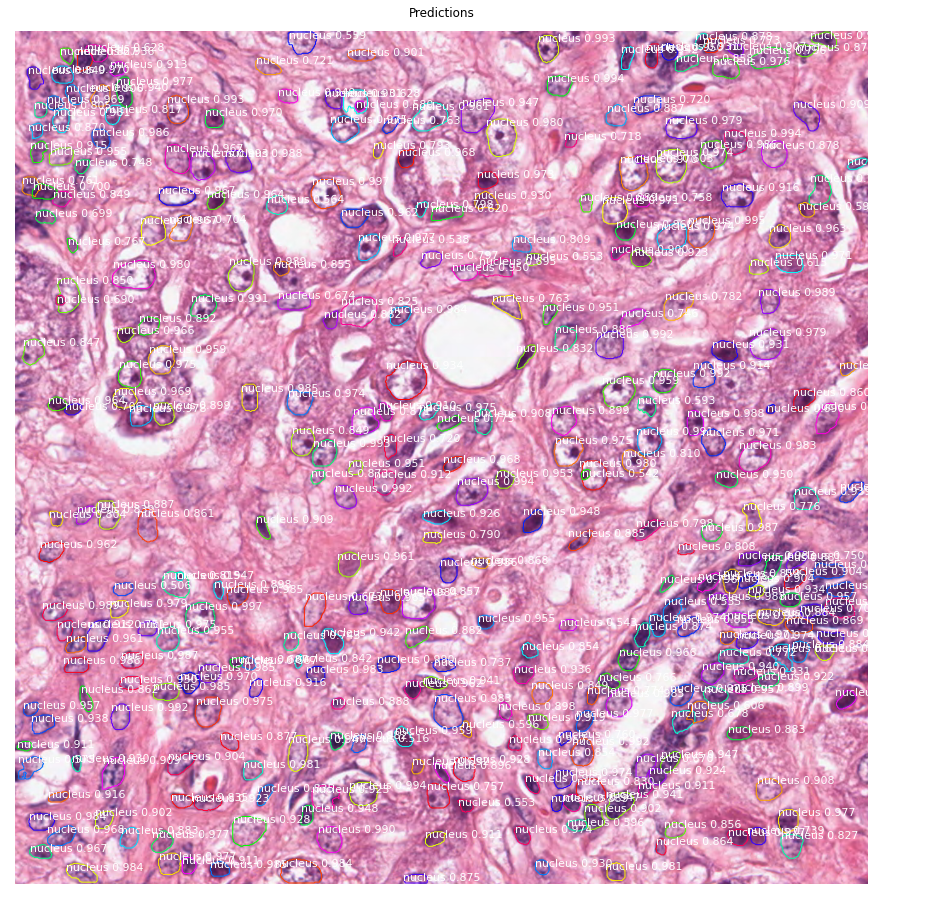

All masks shape:  (1000, 1000, 341)
Score:  0.9909101128578186
{'image_id': 3, 'bbox': [302, 36, 323, 62], 'score': 0.9909101128578186, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'P^T11So09J2N2N2N2O0O2O00000O10000001O0O101N1O2O1N2N2N3Llfcl0'}}
Score:  0.9852105975151062
{'image_id': 3, 'bbox': [96, 671, 120, 694], 'score': 0.9852105975151062, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'V[`d01To0?D1N2O1O0O20O00010O001O001O001O1N3N1N3M5JRgZ9'}}
Score:  0.9818529486656189
{'image_id': 3, 'bbox': [315, 2, 335, 28], 'score': 0.9818529486656189, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'RW46Po04M2N2N2O001N101O0000000000000000O2O000O2M4LZlem0'}}
Score:  0.981480062007904
{'image_id': 3, 'bbox': [497, 341, 521, 367], 'score': 0.981480062007904, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': ']^_:;ln04L2O1N2O001O0010O0001O000001O001O001O1N2L4M5HaeYc0'}}
Score:  0.9812126755714417
{'image_id': 3, 'bbox'

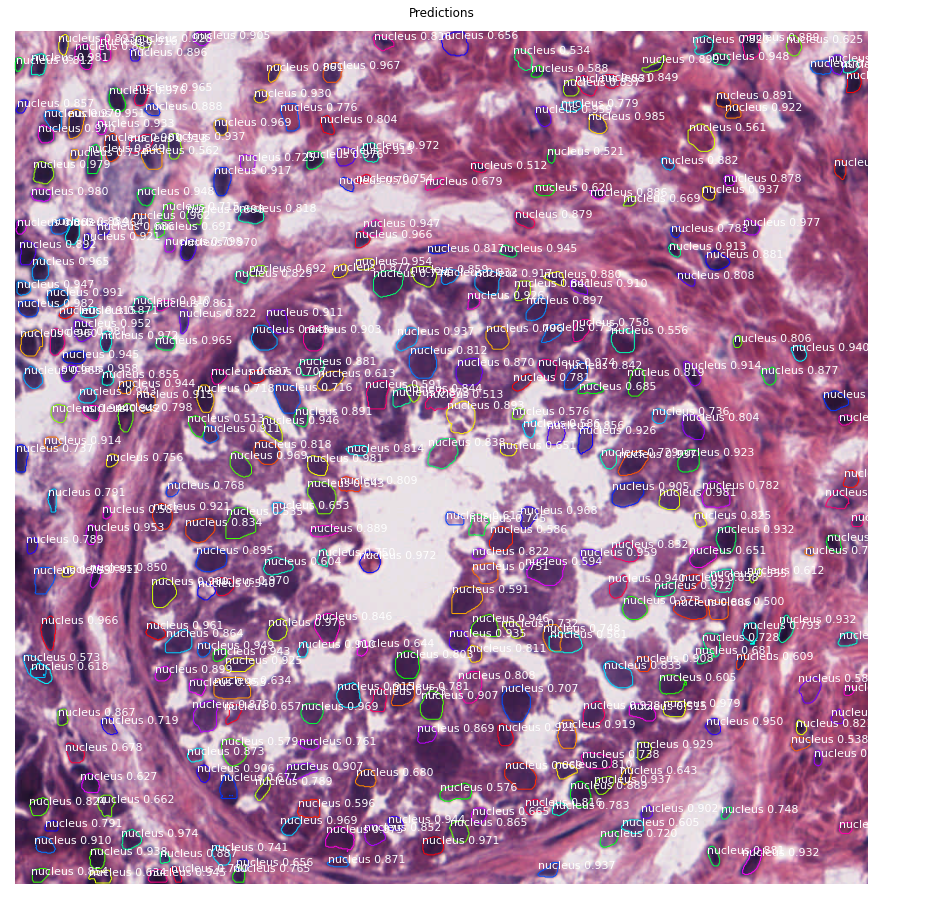

All masks shape:  (1000, 1000, 286)
Score:  0.9849677681922913
{'image_id': 4, 'bbox': [415, 875, 442, 901], 'score': 0.9849677681922913, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'Ymfj03kn0=K3N2O0O2O0O100000000O1000O101O0O1O101N1O2N3LTWR3'}}
Score:  0.9821847081184387
{'image_id': 4, 'bbox': [886, 95, 908, 120], 'score': 0.9821847081184387, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'Qdn29ln05M1O1N200O1O100O100000O100O10001N2O1O1N2O0O3MS`jj0'}}
Score:  0.9798877239227295
{'image_id': 4, 'bbox': [664, 344, 685, 366], 'score': 0.9798877239227295, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'Xba:8nn04M2N1O2N101N10000000000001O0O2O1N3N2M3M__Zc0'}}
Score:  0.977125883102417
{'image_id': 4, 'bbox': [726, 395, 747, 425], 'score': 0.977125883102417, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'j]S<9mn05M1N2O1N2O001O0000000001O001O001O001O0O101N1O2O0O2O1N2Nji`a0'}}
Score:  0.9749740958213806
{'image_

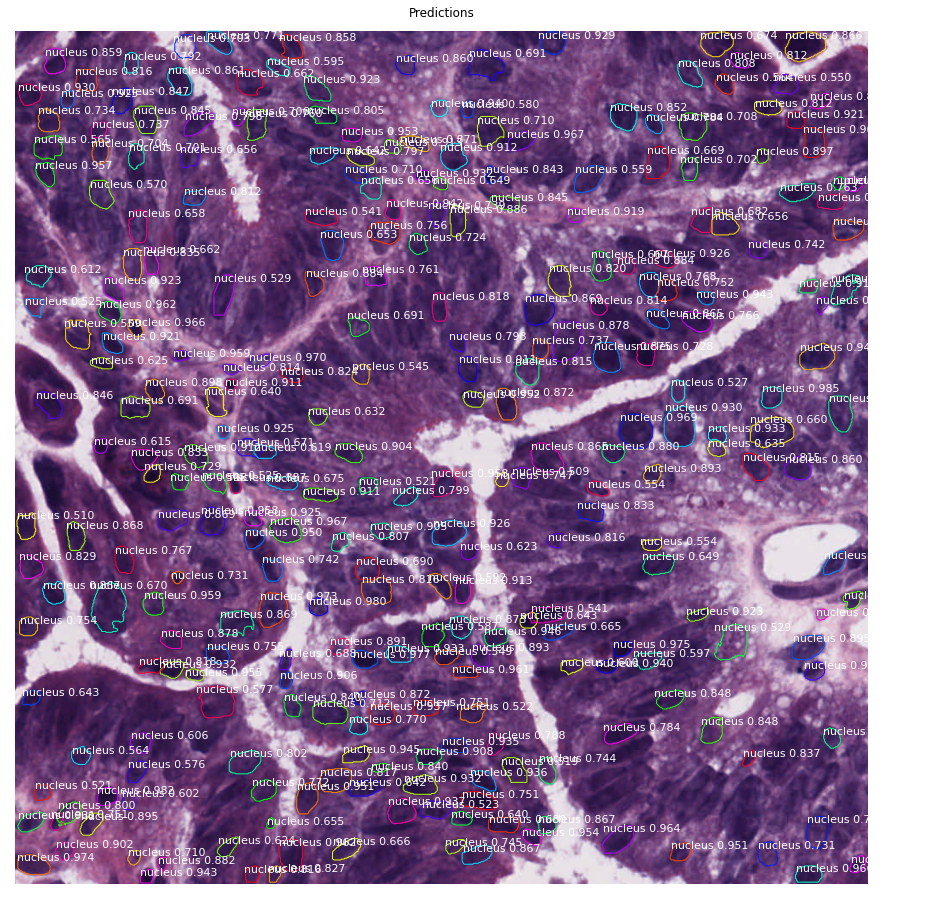

All masks shape:  (1000, 1000, 339)
Score:  0.9976497292518616
{'image_id': 5, 'bbox': [298, 702, 324, 732], 'score': 0.9976497292518616, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': '[j^e06Po06K4L3M2N1O2O0O1000000O1000000001O00001O00001O0O2N2N2M5K_]U8'}}
Score:  0.9971434473991394
{'image_id': 5, 'bbox': [68, 648, 98, 681], 'score': 0.9971434473991394, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'elhc01mn0>J3N3N1N2N101N2O000O2O00000000000001O001O1O0O2O1O1O1N2N2N3M3Kb]h9'}}
Score:  0.9970983266830444
{'image_id': 5, 'bbox': [152, 549, 178, 584], 'score': 0.9970983266830444, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': '\\Yh`07on04M3M2M2O2N2N100O10000O10000000000000000000000001N101O001N2N2O2M3LXRg<'}}
Score:  0.9970291256904602
{'image_id': 5, 'bbox': [921, 416, 949, 443], 'score': 0.9970291256904602, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'QUg<9nn07I2N2N2N2O001N10000O1000000O10000001O0O1O2N1O

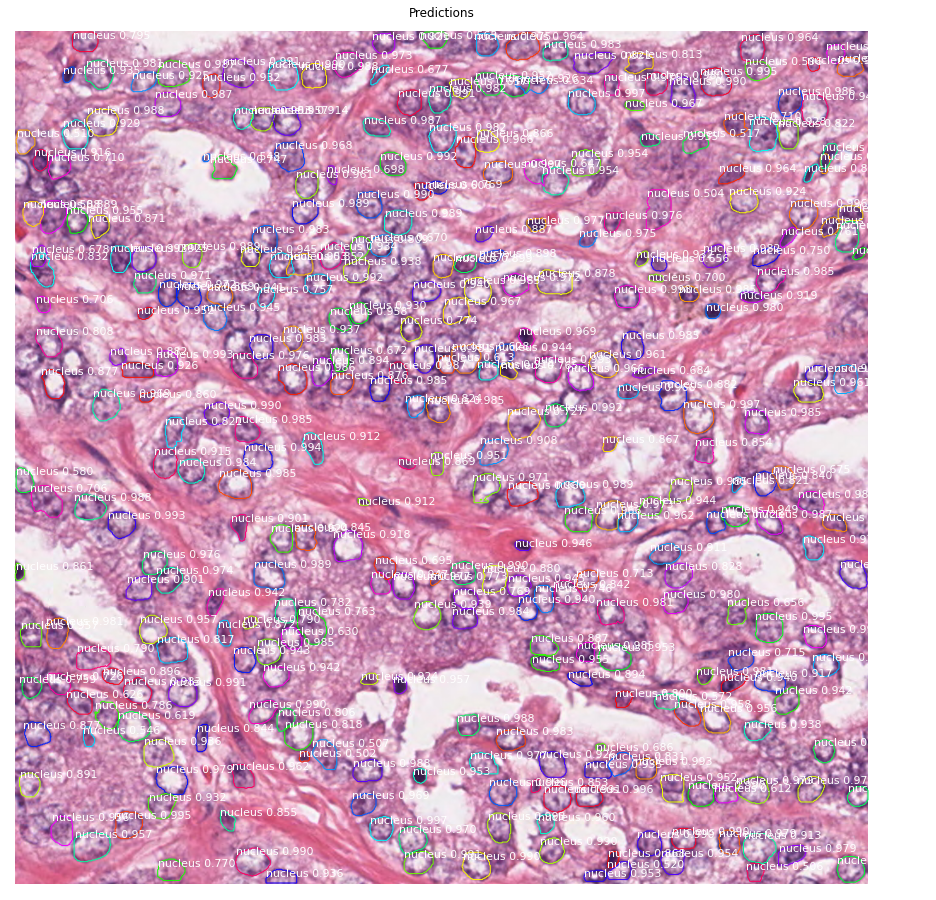

All masks shape:  (1000, 1000, 409)
Score:  0.9943088889122009
{'image_id': 2, 'bbox': [926, 315, 955, 355], 'score': 0.9943088889122009, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'W`e97on05M3L2N2O1N2O1N101N100000001N10000000000001O0O1000000O1O2O0O1O2N2N2N1O3L4J\\nec0'}}
Score:  0.9913544058799744
{'image_id': 2, 'bbox': [594, 180, 626, 215], 'score': 0.9913544058799744, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'V\\`58mn06K3N1O1O1O1O1O1N200O1O1O1O1O1O010O10O100O101N1O100O1O2O0O2N2O1N3L6J]Png0'}}
Score:  0.9912006258964539
{'image_id': 2, 'bbox': [420, 813, 461, 846], 'score': 0.9912006258964539, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'f[jh0;jn06L4K4M3N1N2O0O2O1O1O1O1O10O0010O01O001O0010O01N2O1O2N1M6J7J4Knmf4'}}
Score:  0.9907379746437073
{'image_id': 2, 'bbox': [813, 268, 835, 301], 'score': 0.9907379746437073, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'U_X87Po04L2N2N2N2N100O10000000

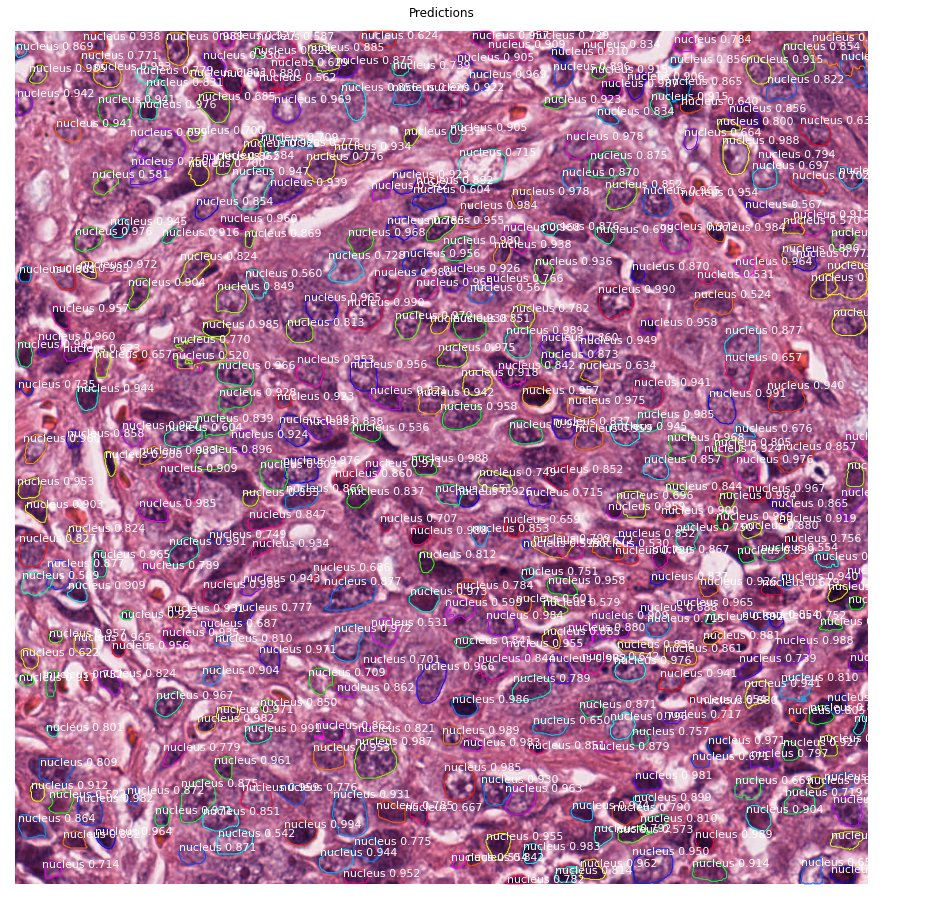

All masks shape:  (1000, 1000, 409)
Score:  0.9964474439620972
{'image_id': 1, 'bbox': [712, 539, 755, 583], 'score': 0.9964474439620972, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'PQa`0`0en05M3M2M4M2N2N1O2O0O2N100O100O100O100000000000000001O1N101N1O2O0O2N2N2N2N2N2N3L5K5Ja`f<'}}
Score:  0.9958783388137817
{'image_id': 1, 'bbox': [148, 881, 194, 919], 'score': 0.9958783388137817, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'g_mj0?en08J4L3M3N2N2N101N100O2O000O100000000O1000000O10O10000O1O2O0O2O1N2M4M3K7E^n^2'}}
Score:  0.9952990412712097
{'image_id': 1, 'bbox': [646, 765, 693, 807], 'score': 0.9952990412712097, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': 'af\\g03Po0<F5M3L3M4M1O2M3O0O1N3O0O1O100O1O100O100O10O100O101N100O2N1O2N1O2N2N2N2M3N2M4L4Lfjk5'}}
Score:  0.9950607419013977
{'image_id': 1, 'bbox': [495, 592, 531, 629], 'score': 0.9950607419013977, 'category_id': 1, 'segmentation': {'size': [1000, 1000], 'counts': '

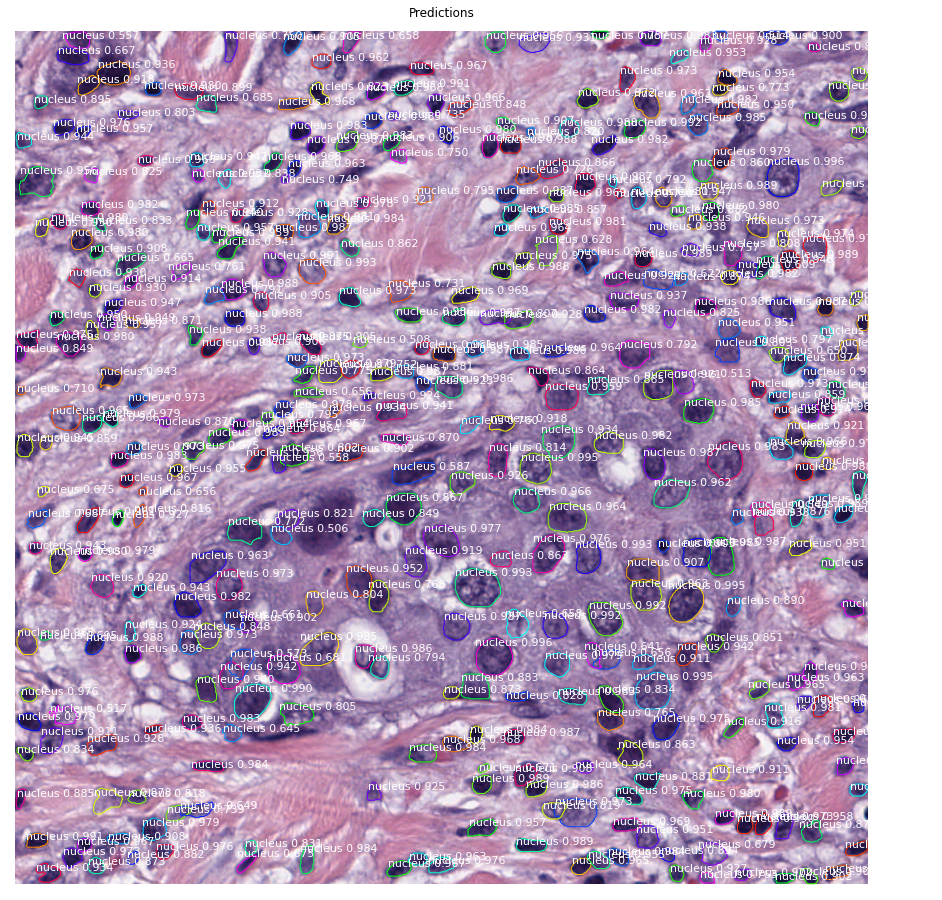

Saved to  /content/Mask_RCNN/results/nucleus/submit_20211216T084441


In [ ]:
if __name__ == '__main__':
    config = NucleusInferenceConfig()
    config.display()
    model = modellib.MaskRCNN(mode="inference", config=config,
                                  model_dir="/content/Mask_RCNN/train_log")
    
    # model weights path
    weights_path = '/content/Mask_RCNN/mask_rcnn_nucleus_0060.h5'
    model.load_weights(weights_path, by_name=True)
    detect(model, "/content/Mask_RCNN/test", 'test')
